### 소상공인시장진흥공단 상가업소정보로 프랜차이즈 입점분석

* 배스킨라빈스와 던킨도너츠는 근처에 입지한 것을 종종 볼 수 있었어요.
* 또, 파리바게뜨와 뚜레주르는 주변에서 많이 볼 수 있는 프랜차이즈 중 하나에요. 
* 이런 프랜차이즈 매장이 얼마나 모여 있는지 혹은 흩어져 있는지 지도에 직접 표시를 해보면서 대용량 데이터에서 원하는 특정 데이터를 추출해 보는 실습을 해봅니다.
* 추출한 데이터를 전처리하고 가공해서 원하는 형태로 시각화를 하거나 지도에 표현합니다.
* Python, Pandas, Numpy, Seaborn, Matplotlib, folium 을 통해 다양한 방법으로 표현하면서 파이썬의 여러 도구들에 익숙해 지는 것을 목표로 합니다.

#### 다루는 내용
* 데이터 요약하기
* 공공데이터를 활용해 텍스트 데이터 정제하고 원하는 정보 찾아내기
* 문자열에서 원하는 텍스트 추출하기
* 문자열을 활용한 다양한 분석 방법과 위치 정보 사용하기
* folium을 통한 위경도 데이터 시각화 이해하기
* folium을 통해 지도에 분석한 내용을 표현하기 - CircleMarker와 MarkerCluster 그리기


#### 데이터셋
* [공공데이터 포털](https://www.data.go.kr/dataset/15012005/fileData.do)

- 가설을 세우고 입증하는 방식으로 분석
    - 배스킨라빈스와 던킨도너츠가 근처에 위치하는지?
    - 프랜차이즈 매장이 흩어진 정도, 모여진 정도를 확인 

### 필요한 라이브러리 불러오기

In [1]:
# pandas, numpu, seaborn 불러오기

import pandas as pd
import numpy as np  # 수치 계산용 라이브러리
import seaborn as sns # 데이터 시각화 위해
import matplotlib.pyplot as plt # seaborn 이 matplotlib 기반이고, 한글폰트 위해 

# 구버전의 주피터 노트북에서 그래프가 보이는 설정
# %matplotlib inline 

### 시각화를 위한 한글폰트 설정하기 

In [2]:
plt.rc("font", family="Malgun Gothic")

# - 마이너스 폰트 해결
plt.rc("axes", unicode_minus=False)

In [3]:
# 선명한 폰트 설정

from IPython.display import set_matplotlib_formats

set_matplotlib_formats("retina")

### 데이터 불러오기
* [공공데이터 포털](https://www.data.go.kr/dataset/15012005/fileData.do)에서 소상공인시장진흥공단 상가업소정보를 다운로드 받아 사용했습니다

In [4]:
# %ls data

In [5]:
# 파일을 불러와 df 변수에 담기

df = pd.read_csv("data/상가업소정보_201912_01.csv", sep='|')
df.shape

(573680, 39)

#### 데이터 미리보기

In [6]:
df.head()
# 사용하지 않을 컬럼들이 많이 보이기 때문에 -> 전처리 필요하다 

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,19905471,와라와라호프,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1168010600106040000014378,대치상가,서울특별시 강남구 남부순환로 2933,135280,6280.0,NaN,1,NaN,127.061026,37.493922
1,19911397,커피빈코리아선릉로93길점,코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010100106960042022041,NaN,서울특별시 강남구 선릉로93길 6,135080,6149.0,NaN,1,NaN,127.047883,37.505675
2,19911801,프로포즈,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1154510200101620001017748,NaN,서울특별시 금천구 가산로 34-6,153010,8545.0,NaN,1,NaN,126.899220,37.471711
3,19912201,싱싱커피&토스트,NaN,Q,음식,Q07,패스트푸드,Q07A10,토스트전문,I56192,...,2653010400105780000002037,산업용품유통상가,부산광역시 사상구 괘감로 37,617726,46977.0,NaN,1,26,128.980455,35.159774
4,19932756,가락사우나내스낵,NaN,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,S96121,...,1171010500102560005010490,NaN,서울특별시 송파구 가락로 71,138846,5690.0,NaN,1,NaN,127.104071,37.500249


#### df info 보기 

In [7]:
df.info()
# memory usage: 170.7+ MB 메모리 사용 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573680 entries, 0 to 573679
Data columns (total 39 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   상가업소번호     573680 non-null  int64  
 1   상호명        573679 non-null  object 
 2   지점명        76674 non-null   object 
 3   상권업종대분류코드  573680 non-null  object 
 4   상권업종대분류명   573680 non-null  object 
 5   상권업종중분류코드  573680 non-null  object 
 6   상권업종중분류명   573680 non-null  object 
 7   상권업종소분류코드  573680 non-null  object 
 8   상권업종소분류명   573680 non-null  object 
 9   표준산업분류코드   539290 non-null  object 
 10  표준산업분류명    539290 non-null  object 
 11  시도코드       573680 non-null  int64  
 12  시도명        573680 non-null  object 
 13  시군구코드      573680 non-null  int64  
 14  시군구명       573680 non-null  object 
 15  행정동코드      573680 non-null  int64  
 16  행정동명       573680 non-null  object 
 17  법정동코드      573680 non-null  int64  
 18  법정동명       573680 non-null  object 
 19  지번코드       573680 non-n

#### 결측치 보기 

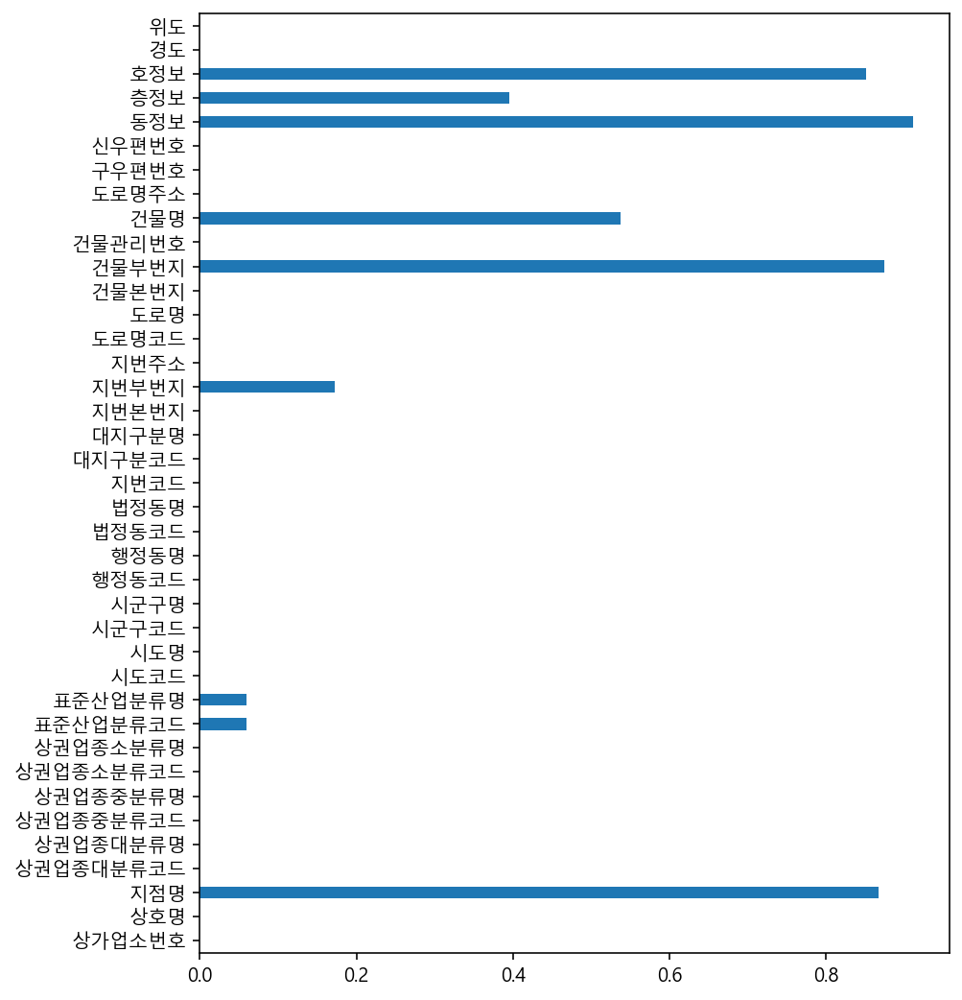

In [8]:
# isnull() 을 사용하여 데이터 결측치 확인하기 

# 결측치는 True로 값이 있다면 False로 표시되는데 True 는 1과 같기 때문에 
# True 값을 sum()을 사용해서 더하게 되면 합계를 볼 수 있습니다.
# mean()을 사용하면 결측치의 비율을 볼 수 있습니다.

df.isnull().sum()
df.isnull().mean() # => 결측치의 비율을 확인가능
df.isnull().mean().plot.barh(figsize=(7,9))

#### 사용하지 않는 컬럼 제거하기 

In [9]:
# drop을 하는 방법도 있지만, 사용할 컬럼만 따로 모아서 볼수도 있다.

# 사용할 컬럼만 따로 모아 보기 

columns = ['상호명', '상권업종대분류명', '상권업종중분류명', '상권업종소분류명', 
           '시도명',  '시군구명', '행정동명', '법정동명', '도로명주소', 
           '경도', '위도']

print(df.shape)
df = df[columns].copy()
df.shape

(573680, 39)


(573680, 11)

In [10]:
# 제거 후 메모리 사용량 비교하기 => memory usage: 48.1+ MB  감소 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573680 entries, 0 to 573679
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   상호명       573679 non-null  object 
 1   상권업종대분류명  573680 non-null  object 
 2   상권업종중분류명  573680 non-null  object 
 3   상권업종소분류명  573680 non-null  object 
 4   시도명       573680 non-null  object 
 5   시군구명      573680 non-null  object 
 6   행정동명      573680 non-null  object 
 7   법정동명      573680 non-null  object 
 8   도로명주소     573680 non-null  object 
 9   경도        573680 non-null  float64
 10  위도        573680 non-null  float64
dtypes: float64(2), object(9)
memory usage: 48.1+ MB


### 색인으로 서브셋 가져오기 

#### 서울만 따로 보기 

In [11]:
# 시도명이 서울로 시작하는 데이터만 봅니다.
# 또, df_seoul 이라는 변수에 결과를 저장합니다.
# 새로운 변수에 데이터프레임을 할당할 때 copy()를 사용하는 것을 권장합니다.

df_seoul = df[df["시도명"] == "서울특별시"].copy()
print(df_seoul.shape)
df_seoul.head()

(407376, 11)


,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도
0,와라와라호프,음식,유흥주점,호프/맥주,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 남부순환로 2933,127.061026,37.493922
1,커피빈코리아선릉로93길점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 선릉로93길 6,127.047883,37.505675
2,프로포즈,음식,유흥주점,호프/맥주,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 가산로 34-6,126.899220,37.471711
4,가락사우나내스낵,생활서비스,대중목욕탕/휴게,사우나/증기탕/온천,서울특별시,송파구,석촌동,석촌동,서울특별시 송파구 가락로 71,127.104071,37.500249
5,초밥왕,음식,일식/수산물,음식점-초밥전문,서울특별시,송파구,잠실6동,신천동,서울특별시 송파구 올림픽로 293-19,127.102490,37.515149


In [12]:
# unique 로 중복을 제거한 시군구명 가져오기

df_seoul["시군구명"].unique()

array(['강남구', '금천구', '송파구', '광진구', '강서구', '중구', '서초구', '성북구', '구로구',
       '영등포구', '서대문구', '동대문구', '노원구', '동작구', '성동구', '관악구', '강동구', '양천구',
       '종로구', '강북구', '은평구', '중랑구', '도봉구', '마포구', '용산구'], dtype=object)

In [13]:
# nunique 로 중복을 제거한 시군구명 갯수 세기

df_seoul["시군구명"].nunique()

25

### 파일로 저장하기 
* 전처리한 파일을 저장해 두면 재사용을 할 수 있습니다.
* 재사용을 위해 파일로 저장합니다.

In [14]:
# "seoul_open_store.csv" 이름으로 저장하기 

df_seoul.to_csv("seoul_open_store.csv", index=False)
# index=False 로 컬럼명 없이 저장 옵션 

In [15]:
# 제대로 저장됐는지 파일 불러와보기 

pd.read_csv("seoul_open_store.csv").head()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도
0,와라와라호프,음식,유흥주점,호프/맥주,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 남부순환로 2933,127.061026,37.493922
1,커피빈코리아선릉로93길점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 선릉로93길 6,127.047883,37.505675
2,프로포즈,음식,유흥주점,호프/맥주,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 가산로 34-6,126.899220,37.471711
3,가락사우나내스낵,생활서비스,대중목욕탕/휴게,사우나/증기탕/온천,서울특별시,송파구,석촌동,석촌동,서울특별시 송파구 가락로 71,127.104071,37.500249
4,초밥왕,음식,일식/수산물,음식점-초밥전문,서울특별시,송파구,잠실6동,신천동,서울특별시 송파구 올림픽로 293-19,127.102490,37.515149


### 배스킨라빈스, 던킨도너츠 위치 분석

#### 특정 상호만 가져오기
* 여기에서는 배스킨라빈스와 던킨도너츠 상호를 가져와서 실습합니다.
* 위에서 pandas의 **str.conatains**를 활용해 봅니다.
* https://pandas.pydata.org/docs/user_guide/text.html#testing-for-strings-that-match-or-contain-a-pattern

* 상호명에서 브랜드명을 추출합니다.
* 대소문자가 섞여 있을 수도 있기 때문에 대소문자를 변환해 줍니다.
* 오타를 방지하기 위해 배스킨라빈스의 영문명은 baskinrobbins, 던킨도너츠는 dunkindonuts 입니다.

In [16]:
# str.lower() 로 영문자열의 모두 소문자로 변경 메소드 사용하기
# "상호명_소문자" 컬럼 만들기

df_seoul["상호명_소문자"] = df_seoul["상호명"].str.lower()

In [17]:
# pandas warning대로 str.extract 사용하면 
# 배 와 베를 따로 가져오게됨

df_seoul["상호명_소문자"].str.extract("(배|베)스킨라빈스|baskinrobbins")[0].value_counts()

배    347
베    117
Name: 0, dtype: int64

In [18]:
# baskinrobbins 를 "상호명_소문자" 컬럼으로 가져옵니다.
# 띄어쓰기 등의 다를 수 있기 때문에 앞글자 baskin 만 따서 가져오도록 합니다.
# '상호명_소문자'컬럼으로 '배스킨라빈스|baskin' 를 가져와 갯수를 세어봅니다.
# loc[행]
# loc[행, 열]

# df_seoul[df_seoul["상호명_소문자"].str.contains("(배|베)스킨라빈스|baskinrobbins")]

# df_seoul[df_seoul["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskinrobbins")].shape

df_seoul.loc[df_seoul["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskinrobbins"),
            "상호명_소문자"]


76             배스킨라빈스
2164           베스킨라빈스
11060     베스킨라빈스은행나무점
13953          배스킨라빈스
14201          베스킨라빈스
             ...     
557464       배스킨라빈스31
557822       배스킨라빈스31
558006       배스킨라빈스31
561929       배스킨라빈스31
561930       배스킨라빈스31
Name: 상호명_소문자, Length: 466, dtype: object

In [19]:
# 상호명에서 던킨도너츠만 가져옵니다.
# 상호명은 소문자로 변경해 준 컬럼을 사용합니다.
# 던킨|dunkin 의 "상호명_소문자"로 갯수를 세어봅니다.

df_seoul.loc[df_seoul["상호명_소문자"].str.contains("던킨|dunkin"), "상호명_소문자"]

1167              던킨도너츠
1819        던킨도너츠테크노마트점
2305         던킨도너츠창동하나로
2342      던킨도너츠용산민자역사2호
3007              던킨도너츠
              ...      
553907            던킨도너츠
554211            던킨도너츠
558894    dunkindoonuts
560984            던킨도너츠
569825            던킨도너츠
Name: 상호명_소문자, Length: 191, dtype: object

In [20]:
466 + 191

657

In [21]:
# '상호명_소문자'컬럼으로  '배스킨|베스킨|baskin|던킨|dunkin'를 가져와 
# df_31 변수에 담기

df_31 = df_seoul[df_seoul["상호명_소문자"].str.contains("배스킨|베스킨|baskin|던킨|dunkin")].copy()
df_31.shape

(659, 12)

In [22]:
# ~은 not을 의미합니다. 베스킨라빈스가 아닌 데이터를 찾을 때 사용하면 좋습니다.
# 아래 코드처럼 결측치를 던킨도너츠로 채워줘도 괜찮습니다.


df_31.loc[df_31["상호명_소문자"].str.contains("배스킨|베스킨|baskin"),
          "브랜드명"] = "배스킨라빈스"
df_31[["상호명_소문자", "브랜드명"]].head()

,상호명_소문자,브랜드명
76,배스킨라빈스,배스킨라빈스
1167,던킨도너츠,NaN
1819,던킨도너츠테크노마트점,NaN
2164,베스킨라빈스,배스킨라빈스
2305,던킨도너츠창동하나로,NaN


In [23]:
# 'df_31에 담긴 상호명','브랜드명'으로 미리보기를 합니다.
# df_31.loc[~df_31["상호명_소문자"].str.contains("배스킨라빈스|베스킨라빈스|baskinrobbins"), 
#           "브랜드명"]

df_31["브랜드명"] = df_31["브랜드명"].fillna("던킨도너츠")
df_31["브랜드명"]

76        배스킨라빈스
1167       던킨도너츠
1819       던킨도너츠
2164      배스킨라빈스
2305       던킨도너츠
           ...  
558894     던킨도너츠
560984     던킨도너츠
561929    배스킨라빈스
561930    배스킨라빈스
569825     던킨도너츠
Name: 브랜드명, Length: 659, dtype: object

In [24]:
# 데이터가 제대로 모아졌는지 확인합니다.
# "상권업종대분류명"을  value_counts 를 통해 빈도수를 계산합니다.

df_31["상권업종대분류명"].value_counts()

음식       657
소매         1
생활서비스      1
Name: 상권업종대분류명, dtype: int64

In [25]:
# "상권업종대분류명"컬럼에서 isin 기능을 사용해서 "소매", "생활서비스" 인 데이터만 가져옵니다.

df_31[df_31["상권업종대분류명"].isin(["소매", "생활서비스"])]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
358699,배스킨라빈스,소매,종합소매점,할인점,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 압구정로 204,127.029381,37.527375,배스킨라빈스,배스킨라빈스
556592,baskinrobbins,생활서비스,광고/인쇄,인쇄종합,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 강남대로 396,127.028289,37.498154,baskinrobbins,배스킨라빈스


In [26]:
# "상권업종대분류명"에서 "소매", "생활서비스"는 제외합니다.

df_31 = df_31[~df_31["상권업종대분류명"].isin(["소매", "생활서비스"])].copy()
df_31.shape

(657, 13)

#### 범주형 값으로 countplot 그리기

In [27]:
# value_counts 로 "브랜드명" 빈도수 구하기

brand_count = df_31["브랜드명"].value_counts()
brand_count 

배스킨라빈스    466
던킨도너츠     191
Name: 브랜드명, dtype: int64

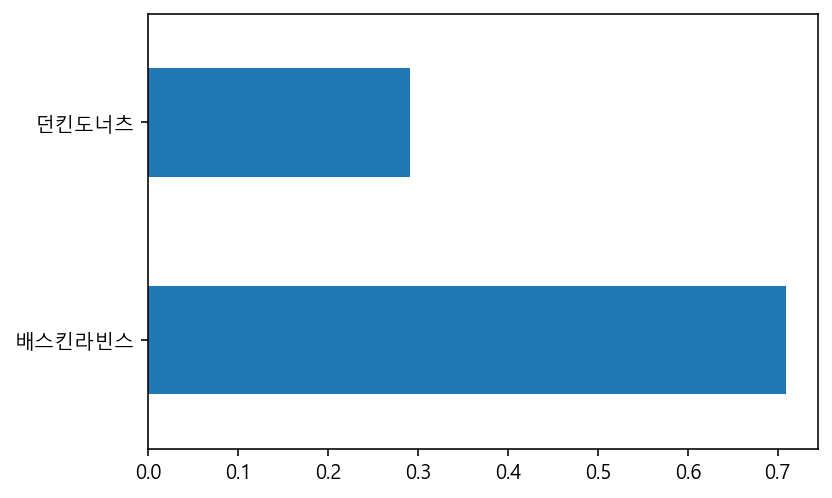

In [28]:
# normalize=True 로 빈도수의 비율을 구합니다.

df_31["브랜드명"].value_counts(normalize=True)
df_31["브랜드명"].value_counts(normalize=True).plot.barh()

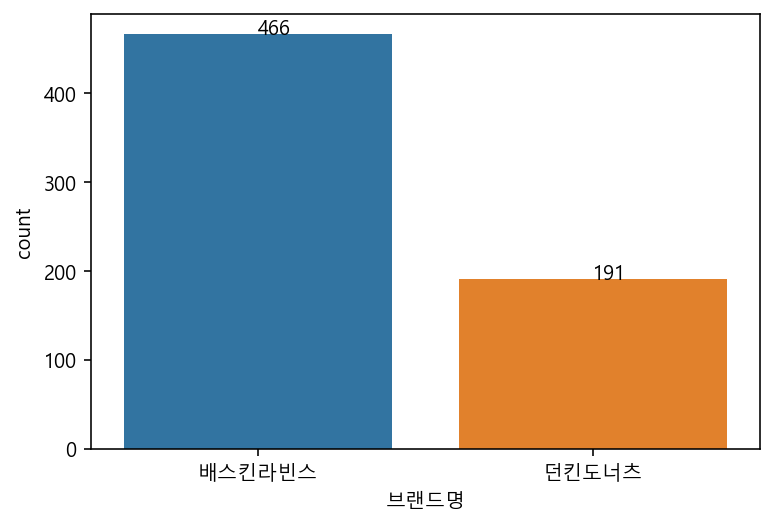

In [29]:
# countplot 을 그립니다.
g = sns.countplot(data=df_31, x="브랜드명")

#g.text(x=0, y=brand_count[0], s=brand_count[0])
#g.text(x=1, y=brand_count[1], s=brand_count[1])

for i, val in enumerate(brand_count.index):
    g.text(x=i, y=brand_count[i], s=brand_count[i])
    

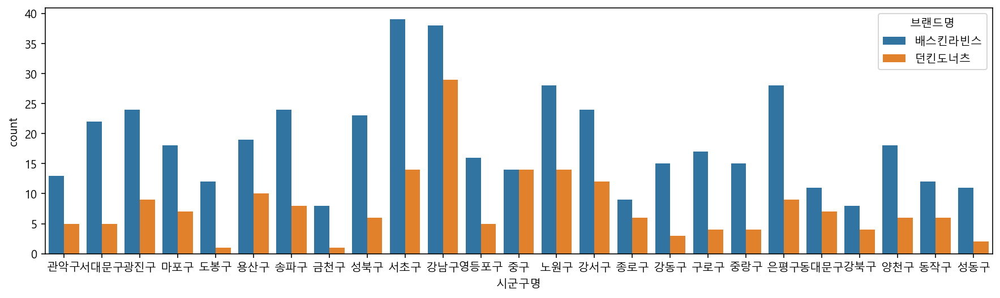

In [30]:
# 시군구명으로 빈도수를 세고 
# 브랜드명으로 색상을 다르게 표현하는 countplot 을 그립니다.

plt.figure(figsize=(15,4))
g = sns.countplot(data=df_31, x="시군구명", hue="브랜드명")

# 도봉구, 은평구 는 배 보다 던 이 많다 

#### scatterplot 그리기

* https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html#scatter-plot

##### Pandas의 scatterplot 으로 표현하기

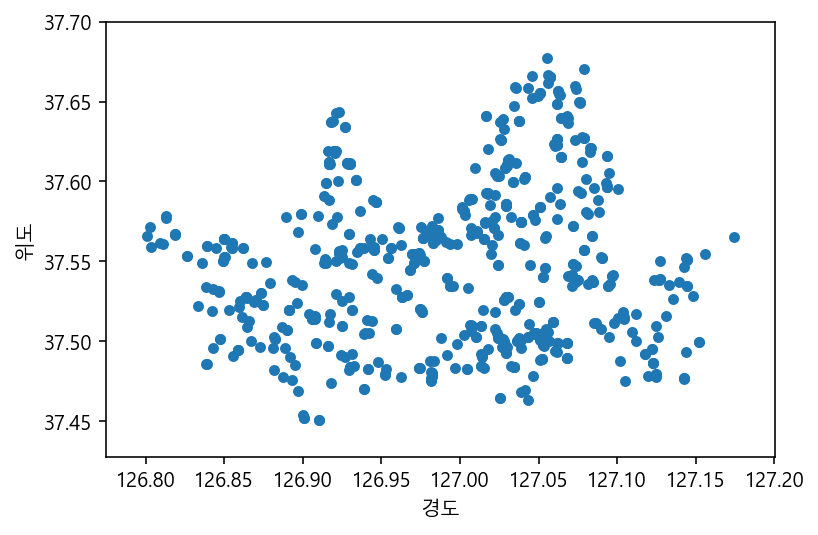

In [31]:
# Pandas 의 plot 으로 scatterplot 을 그립니다.

df_31[["위도","경도"]].plot.scatter(x="경도", y="위도")

##### Seaborn의 scatterplot 으로 표현하기
- seaborn 의 편리한 점 - hue 옵션 이용하여 다른 색상으로 바로 표현 가능 

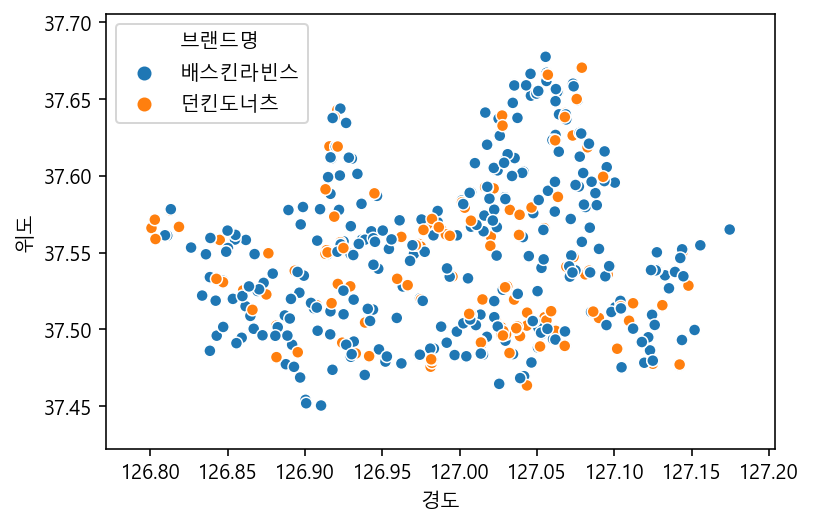

In [32]:
# seaborn의 scatterplot 으로 hue에 브랜드명을 지정해서 시각화 합니다.

sns.scatterplot(data=df_31, x="경도", y="위도", hue="브랜드명")

* jointplot : scatterplot + 히스토그램 
어디에서 빈도수가 많은지를 같이 표현해준다. 
- kind="hex" : 헥사분할 빈 플롯. scatterplot 과 히스토그램을 합쳐서, 
색상의 명도로 빈도수 표현

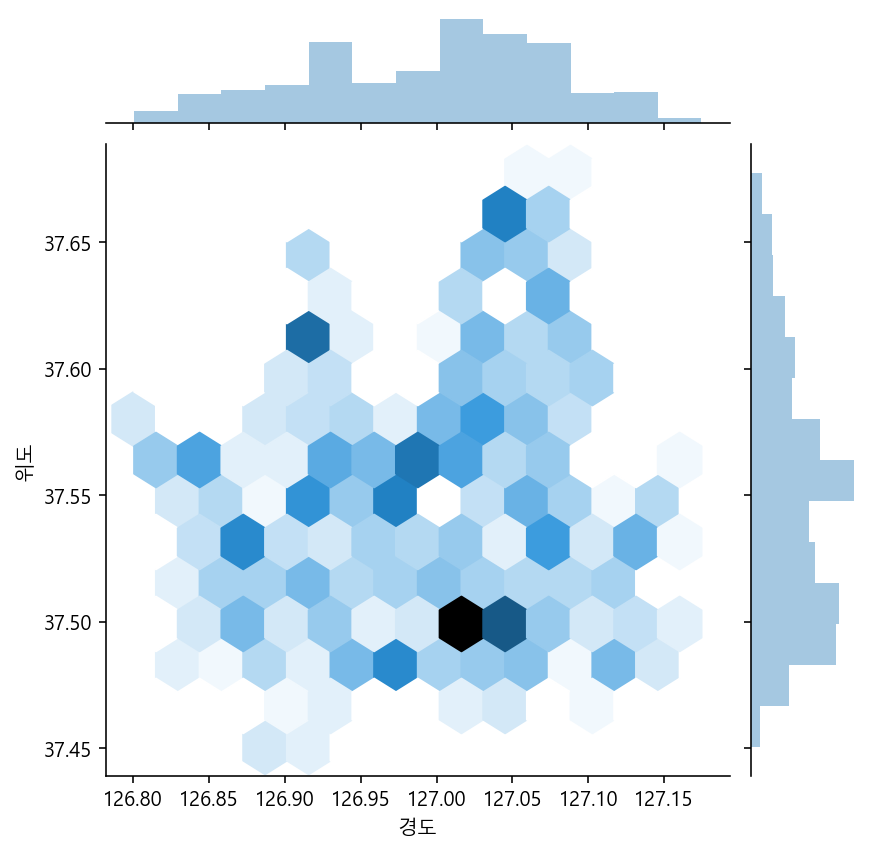

In [33]:
# 위에서 그렸던 그래프를 jointplot 으로 kind="hex" 을 사용해 그려봅니다.

sns.jointplot(data=df_31, x="경도", y="위도", kind="hex")

### [Folium](*https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/Quickstart.ipynb) 으로 지도 활용하기

In [34]:
# 아나콘다에서 folium 을 사용하기 위해서는 별도의 설치가 필요
# 지도 시각화를 위한 라이브러리

import folium

In [35]:
# 지도의 중심을 지정하기 위해 위도와 경도의 평균을 구합니다. 

lat = df_31["위도"].mean()
long = df_31["경도"].mean()

In [41]:
# 샘플을 하나 추출해서 지도에 표시해 봅니다.

# folium.Map?

m = folium.Map([lat, long])

folium.Marker(
    [37.538335, 127.074625],
    popup="<i>배스킨라빈스</i>",
    tooltip="배스킨라빈스").add_to(m)
m

In [40]:
# folium 사용법을 보고 일부 데이터를 출력해 봅니다.

df_31.sample(random_state=31)
# 127.074625	37.538335

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자,브랜드명
355666,배스킨라빈스31건대동문회관점,음식,패스트푸드,아이스크림판매,서울특별시,광진구,자양3동,자양동,서울특별시 광진구 아차산로36길 5,127.074625,37.538335,배스킨라빈스31건대동문회관점,배스킨라빈스


#### 서울의 배스킨라빈스와 던킨도너츠 매장 분포
* 배스킨라빈스와 던킨도너츠 매장을 지도에 표현합니다.

In [38]:
# 데이터프레임의 인덱스만 출력
df_31.index

Int64Index([    76,   1167,   1819,   2164,   2305,   2342,   2652,   3007,
             11060,  13042,
            ...
            554896, 555145, 557464, 557822, 558006, 558894, 560984, 561929,
            561930, 569825],
           dtype='int64', length=657)

#### 기본 마커로 표현하기

In [56]:
# # icon=folium.Icon(color=icon_color) 로 아이콘 컬러를 변경합니다.

m = folium.Map([lat, long], zoom_start=12)

for i in df_31.index[:1000]:
    
    sub_lat = df_31.loc[i, "위도"]
    sub_long = df_31.loc[i, "경도"]
    title = df_31.loc[i, "상호명"] + " - " + df_31.loc[i,"도로명주소"]
    
    icon_color = "blue"
    if df_31.loc[i,"브랜드명"] == "던킨도너츠":
        icon_color = "red"
    
    folium.Marker(
        [sub_lat, sub_long],
        icon=folium.Icon(color=icon_color),
        popup=f"<i>{title}</i>",
        tooltip=title).add_to(m)
m

# 배스킨라빈스가 더 많아 보임
# 서로 매장이 근처에 있는 경우 많이 볼 수 있다

<img src="img/03_folium.png" width="600">

#### MarkerCluster 로 표현하기
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/MarkerCluster.ipynb
- 겹쳐 있는 표시는 숫자로 보여준다.
- 확대하고 축소할때마다, 인근매장을 Cluster로 묶어준다. 

In [58]:
from folium.plugins import MarkerCluster

In [59]:
# icon=folium.Icon(color=icon_color) 로 아이콘 컬러를 변경합니다.

m = folium.Map([lat, long], zoom_start=12)
marker_cluster = MarkerCluster().add_to(m)

for i in df_31.index:
    
    sub_lat = df_31.loc[i, "위도"]
    sub_long = df_31.loc[i, "경도"]
    title = df_31.loc[i, "상호명"] + " - " + df_31.loc[i,"도로명주소"]
    
    icon_color = "blue"
    if df_31.loc[i,"브랜드명"] == "던킨도너츠":
        icon_color = "red"
    
    folium.Marker(
        [sub_lat, sub_long],
        icon=folium.Icon(color=icon_color),
        popup=f"<i>{title}</i>",
        tooltip=title).add_to(marker_cluster)
m

<img src="img/03_folium2.png" width="600">

### 파리바게뜨와 뚜레주르 분석하기
- 편의점, 햄버거, 치킨 등의 다른 카테고리로 분석을 더 해 볼것.


#### 데이터 색인으로 가져오기

In [64]:
df_seoul["상호명"].str.extract("뚜레(주|쥬)르")[0].value_counts()

쥬    257
주      1
Name: 0, dtype: int64

In [65]:
# str.contains 를 사용해서 뚜레(주|쥬)르|파리(바게|크라상) 으로 상호명을 찾습니다.
# df_bread 라는 데이터프레임에 담습니다.

df_bread = df_seoul[df_seoul["상호명"].str.contains("뚜레(주|쥬)르|파리(바게|크라상)")].copy()
df_bread.shape

C:\Users\soomin\anaconda3\lib\site-packages\pandas\core\strings.py:1952: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


(825, 12)

#### 가져온 데이터가 맞는지 확인하기

In [66]:
# 잘못 가져온 데이터가 있는지 확인합니다.

df_bread["상권업종대분류명"].value_counts()

음식       823
학문/교육      2
Name: 상권업종대분류명, dtype: int64

In [70]:
# "상권업종대분류명"이 "학문/교육"이 아닌 것만 가져옵니다.
df_bread[df_bread["상권업종대분류명"] == "학문/교육"]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,도로명주소,경도,위도,상호명_소문자


In [69]:
# 제과점과 상관 없을 것 같은 상점을 추출합니다.

print(df_bread.shape)
df_bread = df_bread[df_bread["상권업종대분류명"] != "학문/교육"].copy()
print(df_bread.shape)

(825, 12)
(823, 12)


In [74]:
# 상호명의 unique 값을 봅니다.

df_bread["상호명"].unique()

# 파스쿠치 등 의 다른 상점도 포함됐음을 확인 할 수 있음 

array(['뚜레쥬르', '파리바게뜨길동사거리점', '파리바게뜨상계제일점', '뚜레쥬르중계브라운', '파리바게뜨-판매옥수점',
       '파리바게뜨당고개점', '파리바게뜨목동오거리점', '뚜레쥬르신당역점', '파리바게뜨', '파리바게뜨서강신수점',
       '파리크라상', '파리바게뜨수유중앙점', '파리바게뜨가락중앙점', '파리바게뜨종로구기',
       '뚜레쥬르왕십리민자역사점왕십리민자역사점', '파리크라상교대역점', '뚜레쥬르도선사거리점', '여의도2호파리크라상',
       '목동파리크라상', '뚜레쥬르개봉역점', '파리바게뜨외대점', '파리크라상파스쿠찌홍', '파리크라상파스쿠찌압',
       'CJ뚜레쥬르', '신목파리바게뜨', '방주산업뚜레쥬르광화문경희궁의', '파리크라상파스쿠찌서', '파리크라상파스쿠찌도',
       '강동경희파리바게뜨', '파리크라상이대점', '파리크라상파스쿠찌압구정역2호', '뚜레쥬르송천센트레빌점',
       '파리크라상잠바주스디큐브', '파리크라상잠바주스대치역', '파리바게트', '상계뚜레쥬르', '뚜레쥬르대림3동점',
       '뚜레쥬르목4동점', '카페약수파리바게트', '파리바게뜨가좌역점', '파리바게뜨영등포구청점', '뚜레쥬르독산지식센터점',
       '파리바게뜨수락리버시티', '파리바게뜨방학중앙점', '파리바게뜨중계2호점', '뚜레쥬르방화역점', '파리바게뜨중앙대점',
       '뚜레쥬르레이크펠리스점', '파리바게뜨장안현대점', '뚜레쥬르우이점', '파리바게뜨성북점', '뚜레쥬르양천푸른점',
       '파리바게뜨마장대로점', '파리바게뜨문정역점', '뚜레쥬르엔시티보라매', '파리바게뜨종로시그니처점',
       '파리바게뜨상계보람점', '파리바게뜨성동세무서점', '파리바게뜨여의경도점', '파리바게뜨구로제일점',
       '뚜레쥬르창동SM마트', '파리바게뜨카페대학로점', '파리바게뜨대림역점', '파리바게뜨월계미성', '파리크라상서래점',
       '파리바게뜨금천한양점', '씨

In [75]:
# 상호명이 '파스쿠찌|잠바주스'가 아닌 것만 가져오세요.

print(df_bread.shape)
df_bread = df_bread[~df_bread["상호명"].str.contains('파스쿠찌|잠바주스')].copy()
print(df_bread.shape)

(823, 12)
(812, 12)


In [76]:
# 브랜드명 컬럼을 만듭니다. "파리바게뜨" 에 해당되는 데이터에 대한 값을 채워줍니다.
# 파리크라상에 대한 처리를 따로 해주세요!
# df_bread.loc[df_bread["상호명"].str.contains("파리크라상"), "브랜드명"] = "파리바게뜨"


df_bread.loc[df_bread["상호명"].str.contains("파리바게"), "브랜드명"] = "파리바게뜨"
df_bread[["상호명", "브랜드명"]].head()

,상호명,브랜드명
2935,뚜레쥬르,NaN
13843,뚜레쥬르,NaN
14031,파리바게뜨길동사거리점,파리바게뜨
14229,파리바게뜨상계제일점,파리바게뜨
14246,뚜레쥬르중계브라운,NaN


In [77]:
# 브랜드명 컬럼의 결측치는 "뚜레쥬르" 이기 때문에 fillna 를 사용해서 값을 채웁니다.

df_bread["브랜드명"] = df_bread["브랜드명"].fillna("뚜레쥬르")
df_bread[["상호명", "브랜드명"]].head()

,상호명,브랜드명
2935,뚜레쥬르,뚜레쥬르
13843,뚜레쥬르,뚜레쥬르
14031,파리바게뜨길동사거리점,파리바게뜨
14229,파리바게뜨상계제일점,파리바게뜨
14246,뚜레쥬르중계브라운,뚜레쥬르


#### 범주형 변수 빈도수 계산하기

In [79]:
# 브랜드명의 빈도수를 봅니다.
# 빈도수 계산할때는 value_counts() 사용

df_bread["브랜드명"].value_counts()

파리바게뜨    515
뚜레쥬르     297
Name: 브랜드명, dtype: int64

In [80]:
# normalize=True 옵션으로 비율도 확인하기
df_bread["브랜드명"].value_counts(normalize=True)

파리바게뜨    0.634236
뚜레쥬르     0.365764
Name: 브랜드명, dtype: float64

- countplot 으로 브랜드명을 그려봅니다.

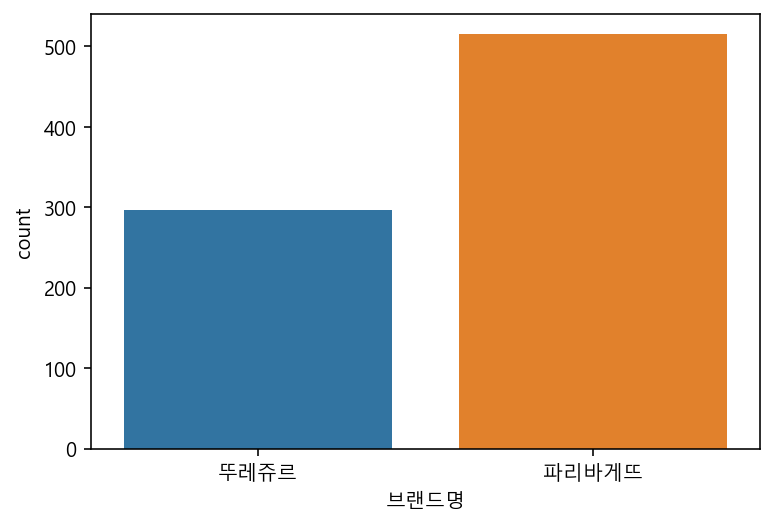

In [81]:
sns.countplot(data=df_bread, x="브랜드명")

# 서울기준으로 파리바게트가 뚜레주르보다 많다

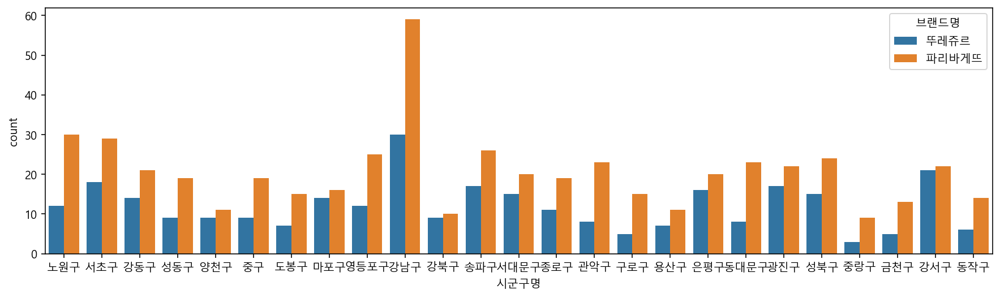

In [83]:
# 시군구별로 브랜드명의 빈도수 차이를 비교합니다.

plt.figure(figsize=(15,4))
sns.countplot(data=df_bread, x="시군구명", hue="브랜드명")

# 강남구에 매장이 많은 것으로 보임. 

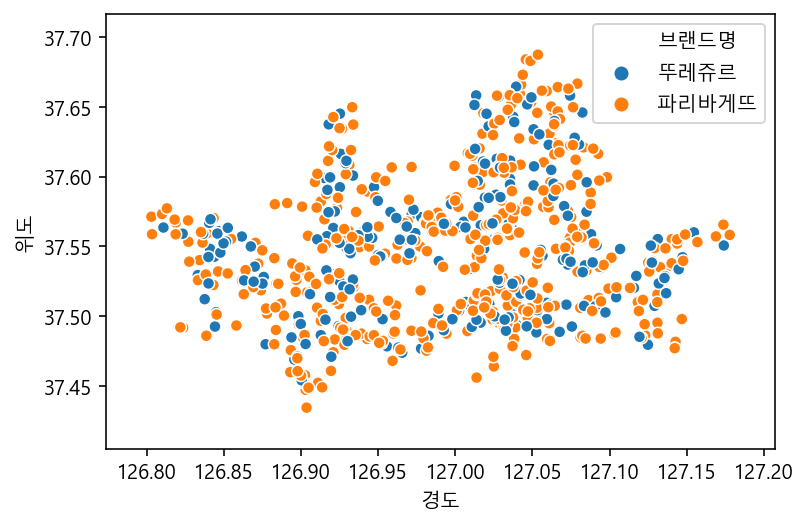

In [85]:
# scatterplot 으로 위경도를 표현해 봅니다.

sns.scatterplot(data=df_bread, x="경도", y="위도", hue="브랜드명")

# 파리바게트 매장 수가 전반적으로 많아 보임 

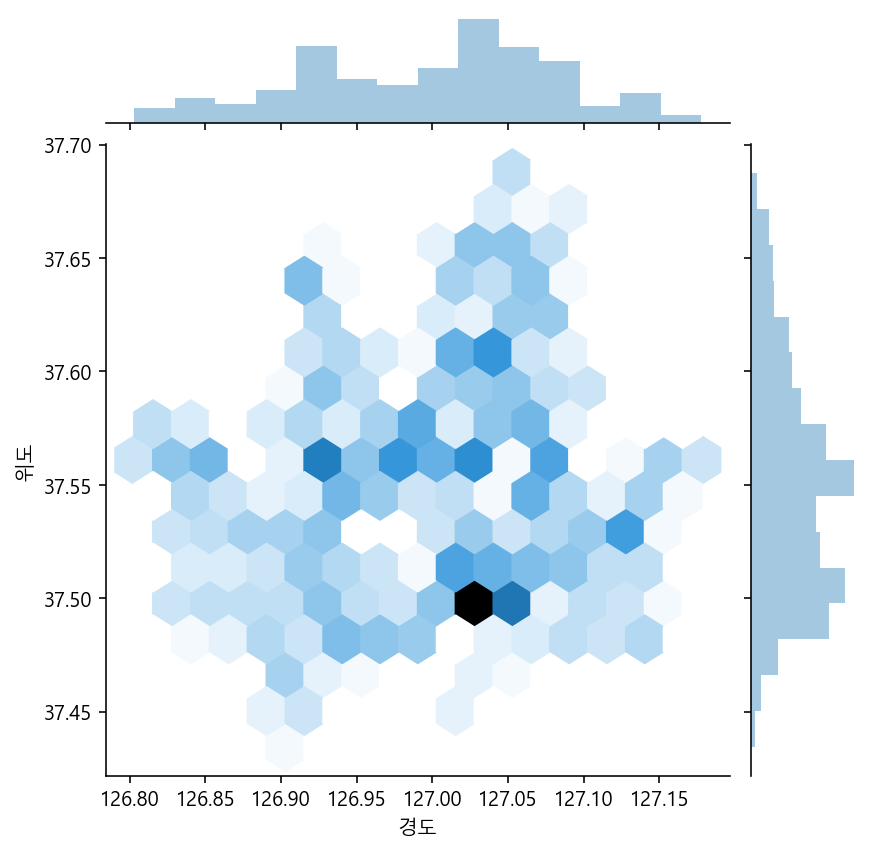

In [88]:
# jointplot 으로 위경도를 표현해 봅니다.

sns.jointplot(data=df_bread, x="경도", y="위도", kind="hex")

### 지도에 표현하기
#### Marker 로 위치를 찍어보기

In [90]:
df_bread.index

Int64Index([  2935,  13843,  14031,  14229,  14246,  14713,  14842,  14889,
             14897,  15019,
            ...
            544366, 544527, 551365, 555475, 556168, 559820, 561538, 561810,
            569327, 569479],
           dtype='int64', length=812)

In [91]:
df_bread.loc[2935, "위도"]

37.62828881495879

In [ ]:
for i in df_bread.index:
    print(i)

In [101]:
# for문을 통해서 각각의 

m = folium.Map([lat, long], zomm_start=12, tiles="stamen toner")

for i in df_bread.index:
    sub_lat = df_bread.loc[i, "위도"]
    sub_long = df_bread.loc[i, "경도"]
    
    title = df_bread.loc[i, "상호명"] + " - " + df_bread.loc[i, "도로명주소"]
    
    icon_color = "blue"
    if df_bread.loc[i, "브랜드명"] == "뚜레쥬르":
        icon_color = "green"
    
    folium.CircleMarker(
        [sub_lat, sub_long],
        radius=3,
        color=icon_color,
        popup=f"<i>{title}</i>",
        tooltip=title).add_to(m)
m

<img src="img/03_folium3.png" width="600">

#### MarkerCluster 로 표현하기
* https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/MarkerCluster.ipynb

In [102]:
# icon=folium.Icon(color=icon_color) 로 아이콘 컬러를 변경합니다.

# for문을 통해서 각각의 

m = folium.Map([lat, long], zomm_start=12, tiles="stamen toner")
marker_cluster = MarkerCluster().add_to(m)

for i in df_bread.index:
    sub_lat = df_bread.loc[i, "위도"]
    sub_long = df_bread.loc[i, "경도"]
    
    title = df_bread.loc[i, "상호명"] + " - " + df_bread.loc[i, "도로명주소"]
    
    icon_color = "blue"
    if df_bread.loc[i, "브랜드명"] == "뚜레쥬르":
        icon_color = "green"
    
    folium.CircleMarker(
        [sub_lat, sub_long],
        radius=3,
        color=icon_color,
        popup=f"<i>{title}</i>",
        tooltip=title).add_to(marker_cluster)
m

# 서울 강남, 특히 강서지역에 많아 보이고,
# 마포, 종로쪽에도 매장이 많아 보임.

<img src="img/03_folium4.png" width="600">

#### Heatmap 으로 그리기
https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/Heatmap.ipynb

- 클러스터를 히트맵으로, 색으로 많고 적음을 표현할 수 있다.
- 사용법이 특이함. -> 2차원 배열 형태로 표현해야함. 

In [103]:
# heatmap 예제 이해하기

data = (
    np.random.normal(size=(100, 3)) * 
    np.array([[1, 1, 1]]) + np.array([[48, 5, 1]])
).tolist()
data[:5]

[[48.88819227889502, 4.740803332465516, -0.07428539183634553],
 [48.241521098855216, 5.251655656985595, 0.28181614250645115],
 [48.16836049483914, 4.742418479230795, -0.2602718704000502],
 [49.42199189295531, 5.167511989226164, 1.4907411340109686],
 [46.40494838198707, 5.386961353649608, 1.0187470547043815]]

In [105]:
# heatmap 예제와 같은 형태로 데이터 2차원 배열 만들기

# 한글로 되어 있는 브랜드명도 -> 숫자로 변경해줘야 히트맵으로 표현가능하다. 

heat = df_bread[["위도", "경도", "브랜드명"]].copy()

,위도,경도,브랜드명
2935,37.628289,127.077295,뚜레쥬르
13843,37.498098,127.025904,뚜레쥬르
14031,37.534154,127.136501,파리바게뜨
14229,37.661367,127.059227,파리바게뜨
14246,37.639918,127.064245,뚜레쥬르


In [115]:
# "브랜드명" 컬럼의 값을 숫자로 변경하기 

heat["브랜드명"] = heat["브랜드명"].replace("뚜레쥬르", 1).replace("파리바게뜨",1)
heat.head()
heat = heat.values

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

* **가중치를 주기 원할때는 변경하는 숫자에 수를 증가시킬 수도 있다.**

In [111]:
heat[:5]

array([[ 37.62828881, 127.07729473,   1.        ],
       [ 37.49809817, 127.02590362,   1.        ],
       [ 37.53415376, 127.13650069,   2.        ],
       [ 37.66136731, 127.059227  ,   2.        ],
       [ 37.63991755, 127.06424515,   1.        ]])

In [116]:
# HeatMap 그리기
from folium.plugins import HeatMap

m = folium.Map([lat, long], tiles="stamentoner", zoom_start=12)

for i in df_bread.index:
    sub_lat = df_bread.loc[i, "위도"]
    sub_long = df_bread.loc[i, "경도"]
    
    title = df_bread.loc[i, "상호명"] + " - " + df_bread.loc[i, "도로명주소"]
    
    icon_color = "blue"
    if df_bread.loc[i, "브랜드명"] == "뚜레쥬르":
        icon_color = "green"
    
    folium.CircleMarker(
        [sub_lat, sub_long],
        radius=3,
        color=icon_color,
        popup=f"<i>{title}</i>",
        tooltip=title).add_to(m)


HeatMap(heat).add_to(m)

m

<img src="img/03_folium5.png" width="600">